<a href="https://colab.research.google.com/github/ucfilho/AI/blob/main/AI_2023%20/CV_stat_math/class_08_licence_plate_identification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install pytesseract

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [2]:
!sudo apt install tesseract-ocr

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [3]:
import pytesseract
import cv2
from google.colab.patches import cv2_imshow
import zipfile

In [4]:
#!git clone https://github.com/ucfilho/Machine_Learning_DataSet
#%cd Machine_Learning_DataSet

In [5]:
!gdown 17DeutH_Rzmw7J6Qdr9XdMFTRSH8v7VvY

Downloading...
From: https://drive.google.com/uc?id=17DeutH_Rzmw7J6Qdr9XdMFTRSH8v7VvY
To: /content/licence_plate.zip
100% 2.96M/2.96M [00:00<00:00, 38.5MB/s]


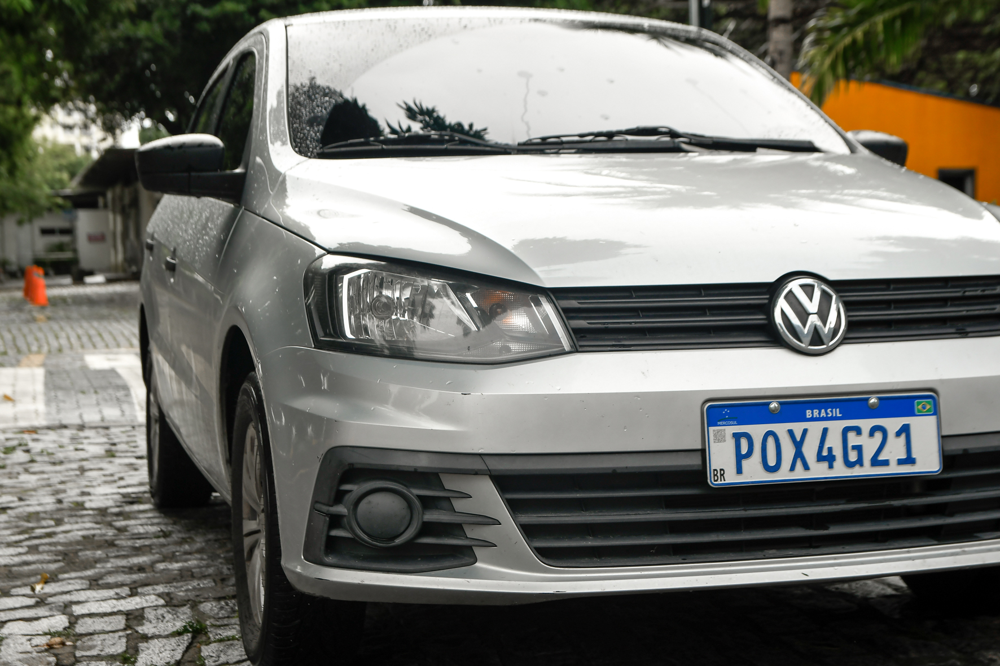

In [6]:
FILE = 'licence_plate.zip'
archive = zipfile.ZipFile(FILE, 'r')
archive.extractall()
#source= 'carro3.jpg'
source= 'placa_carro2.jpg'	
#source ='00011.jpg'
img = cv2.imread(source)
cv2_imshow(img)

In [7]:
scale_percent = 100 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)

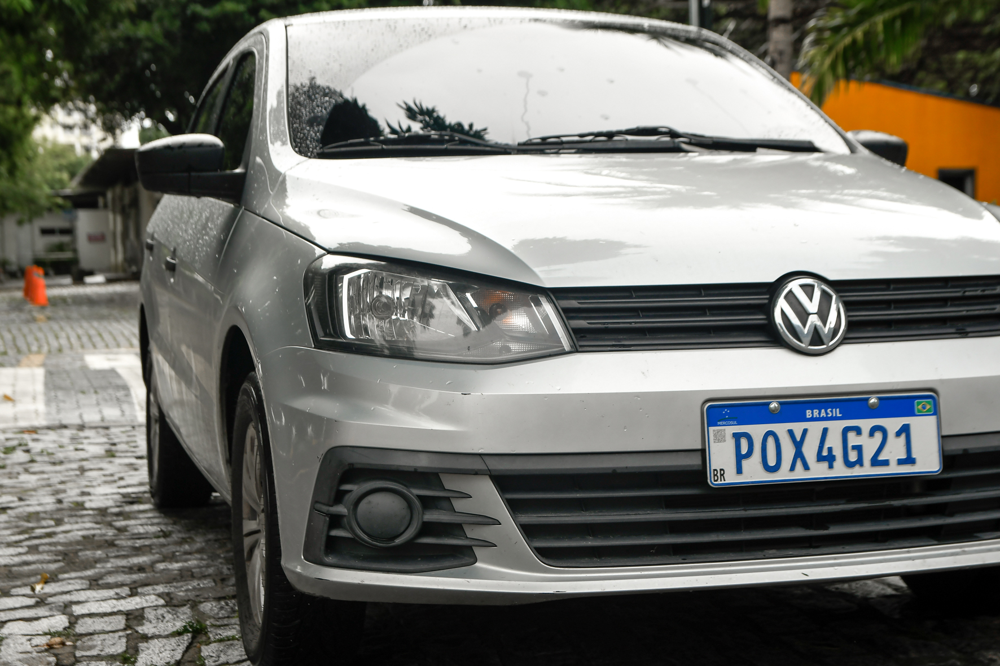

In [8]:
img = cv2.resize(img, dim, interpolation = cv2.INTER_AREA)
cv2_imshow(img)

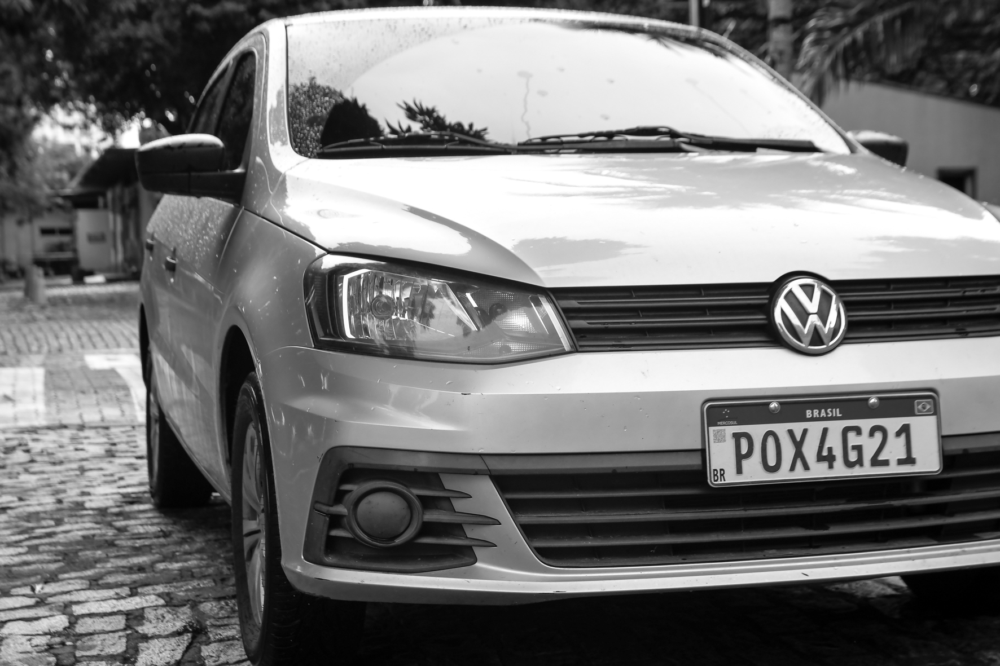

In [9]:
cinza = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
cv2_imshow(cinza)

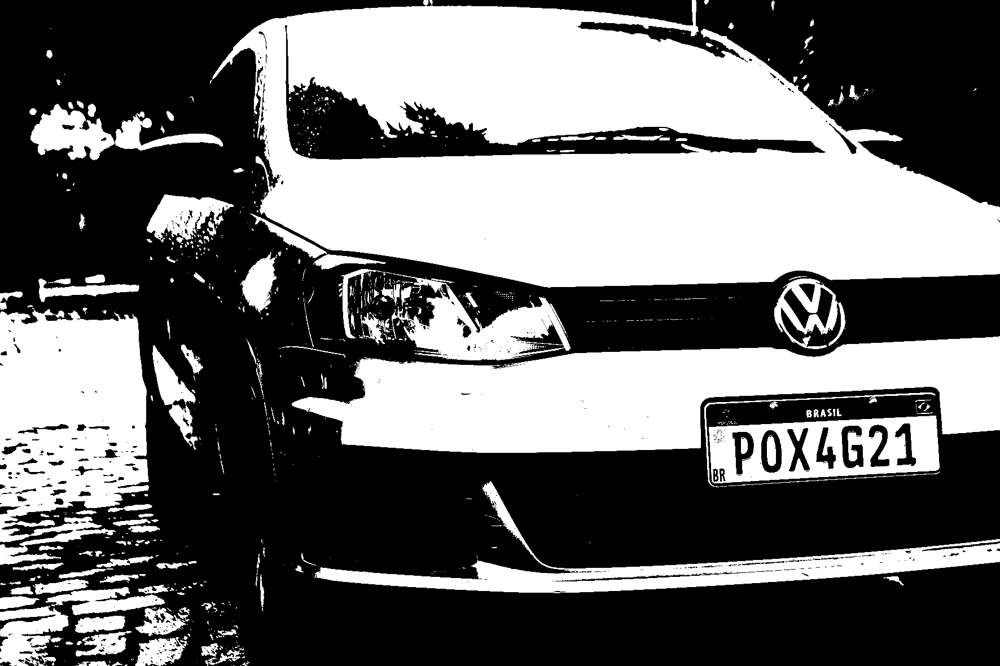

In [10]:
#test, bin = cv2.threshold(cinza, 120, 255, cv2.THRESH_BINARY)
test, bin = cv2.threshold(cinza, 130, 255, cv2.THRESH_BINARY)
cv2_imshow(bin)

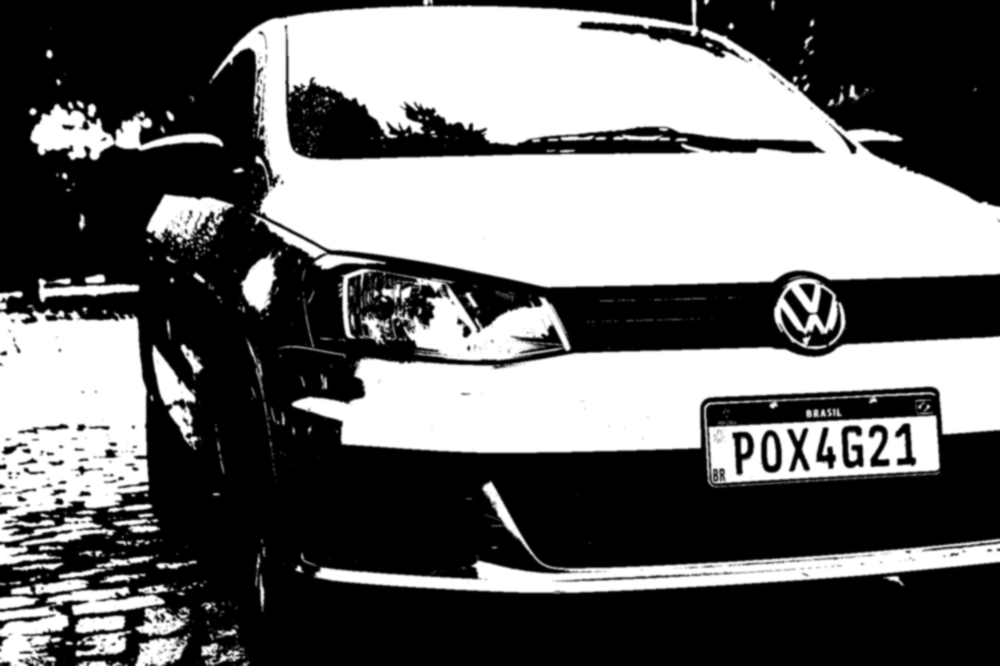

In [11]:
desfoque = cv2.GaussianBlur(bin, (9, 9), 0)
cv2_imshow(desfoque)

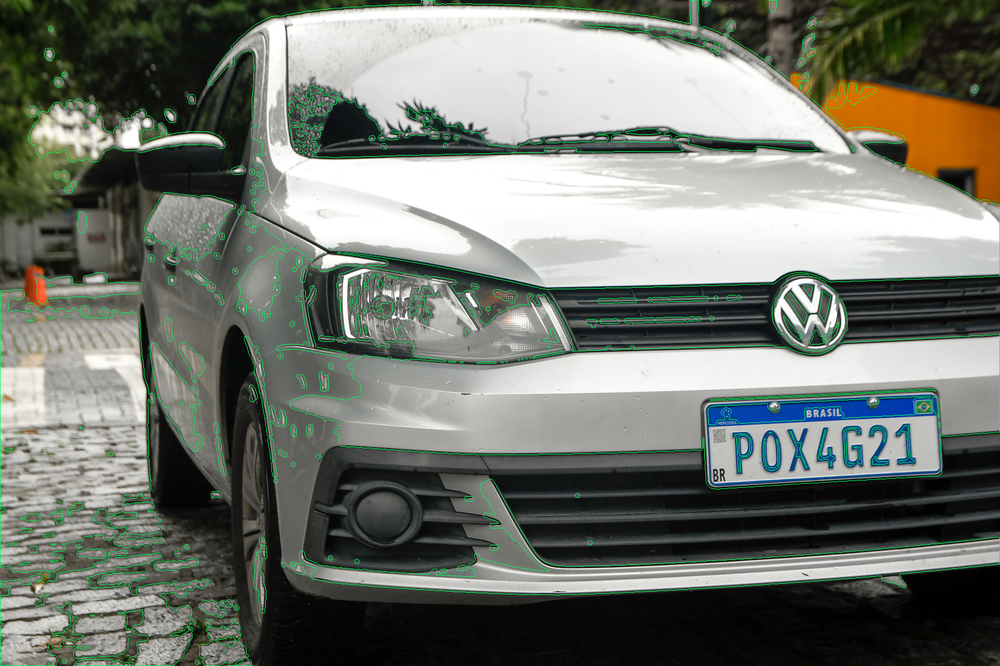

In [12]:
contornos, hierarquia = cv2.findContours(desfoque, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
cv2.drawContours(img, contornos, -1, (90, 255, 0), 1)
cv2_imshow(img)

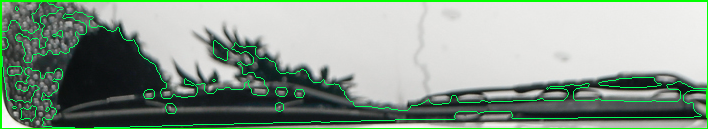

In [13]:
for c in contornos:
    perimetro = cv2.arcLength(c, True)
    if perimetro > 120:
    #if perimetro > 100:
        aprox = cv2.approxPolyDP(c, 0.03 * perimetro, False)
        if len(aprox) == 4:
            (x, y, alt, lar) = cv2.boundingRect(c)
            cv2.rectangle(img, (x, y), (x + alt, y + lar), (0, 255, 0), 2)
            roi = img[y:y + lar, x:x + alt]
try:
  cv2_imshow( roi)
except:
  roi = img
  print('no roi image')
  cv2_imshow( roi)


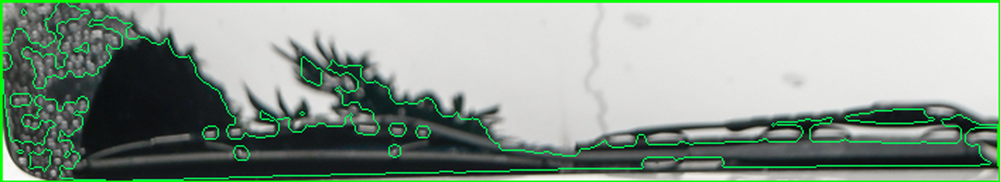

In [14]:
resize_img_roi = cv2.resize(roi, None, fx=4, fy=4, interpolation=cv2.INTER_CUBIC)
cv2_imshow(resize_img_roi)


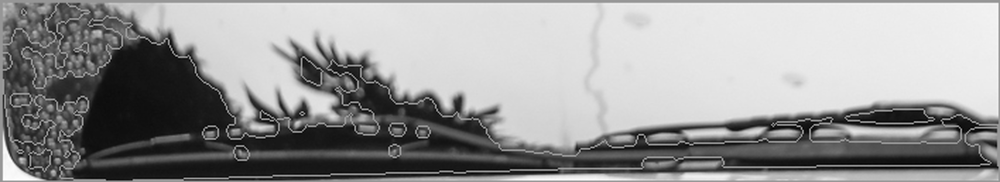

In [15]:
img_cinza = cv2.cvtColor(resize_img_roi, cv2.COLOR_BGR2GRAY)
cv2_imshow(img_cinza)

In [16]:
resize_img_roi.shape

(516, 2832, 3)

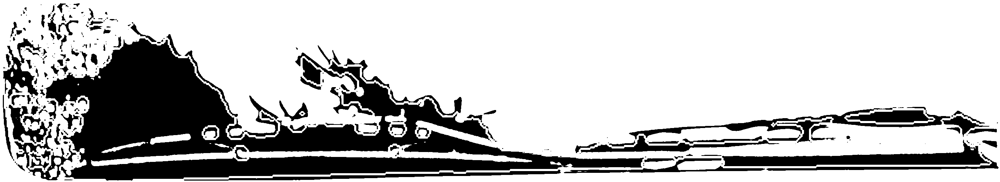

In [17]:
_, img_binary = cv2.threshold(img_cinza, 70, 255, cv2.THRESH_BINARY)
cv2_imshow(img_binary)

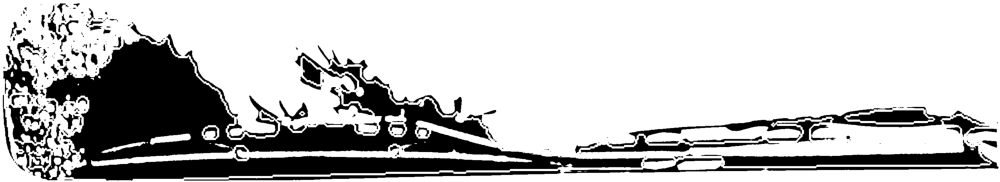

In [18]:
img_desfoque = cv2.GaussianBlur(img_binary, (5, 5), 0)
img_ocr = img_desfoque
cv2_imshow(img_ocr)

In [19]:
config = r'-c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789 --psm 6'
texto = pytesseract.image_to_string(img_ocr, lang='eng', config=config)
print(texto)

AC

SSS
3

OC SM SS
IB SS SS OO
7 NS NEE



In [20]:

texto = pytesseract.image_to_string(bin, lang='eng', config=config)
print(texto)

A
7
P
NN
ON
4 7
OR
A
J
2
5 VN LTT B
1
POX4
ERS VO
5
SS ES



In [21]:
texto = pytesseract.image_to_string(desfoque, lang='eng', config=config)
print(texto)

SE K
PPOKGE21



In [22]:
texto = pytesseract.image_to_string(cinza, lang='eng', config=config)
print(texto)

7
SI
C 9 SS 4 CC
3 3
VV VY WV V
PPOXGG21
PS N
POX4G21
S P
E
PS
SS

